In [ ]:
import scanpy as sc
import scanpy.external as sce
import pandas as pd
from torch_geometric.loader import DataLoader
import matplotlib.pyplot as plt
import matplotlib as mpl
from spatialmst.utils.dataloader import SpatialDataset
from spatialmst.train.SpatialMST_Trainer import SpatialMSTTrainer
from spatialmst.utils.util import construct_mm_adata
from spatialmst.utils.util import cluster_metrics
import warnings

warnings.filterwarnings('ignore')

mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

rc = {'figure.figsize':(10,5),
'axes.facecolor':'white',
'axes.grid' : True,
'grid.color': '.8',
'font.family':'Arial',
'font.size' : 12}
plt.rcParams.update(rc)

import os
os.environ['R_HOME'] = 'C:/Program Files/R/R-4.4.1'

ModuleNotFoundError: No module named 'model'

In [ ]:
mm_adata = construct_mm_adata(rna_path = r"..\data\visium\Human_Breast_Cancer\BRCA_tissue.h5ad",
                              flux_path = r"..\data\Flux\BRCA_tissue\BRCA_spatial_tf_module168.csv",
                              metabolite_path = r"..\data\Flux\BRCA_tissue\BRCA_spatial_tf_metabolites_module168.csv",
                              metabolic_metadata_path = r"..\data/Flux/metabolic_model_metadata.csv")

rna_data = mm_adata.mod['rna']
sc.pp.highly_variable_genes(rna_data, flavor="seurat_v3", n_top_genes=3000, subset=True)
rna_data.var_names_make_unique()
mm_adata.mod['rna'] = rna_data
mm_adata

  Running MAGIC with `solver='exact'` on 36601-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.


MuData object with n_obs × n_vars = 3798 × 36839
  uns:	'spatial', 'log1p'
  obsm:	'spatial', 'label_CSL'
  3 modalities
    rna:	3798 x 474
      obs:	'old_annot_type', 'old_fine_annot_type', '1', '2', '3', '4', '5', 'scaled_x', 'scaled_y', 'fine_annot', 'annot', 'fine_annot_type', 'ground_truth', 'annot_type', 'in_tissue', 'array_row', 'array_col'
      var:	'gene_ids', 'feature_types', 'genome', 'mean', 'std'
      uns:	'spatial', 'log1p'
      obsm:	'spatial'
    flux:	3798 x 168
      var:	'Supermodule_id', 'Super.Module.class', 'X', 'Module_id', 'Compound_IN_name', 'Compound_IN_ID', 'Compound_OUT_name', 'Compound_OUT_ID', 'rxnName'
      uns:	'spatial'
      obsm:	'spatial'
    metabolite:	3798 x 70
      uns:	'spatial'
      obsm:	'spatial'

In [5]:
mm_data = SpatialDataset(mm_adata)
train_loader = DataLoader(mm_data)

In [6]:
Trainer = SpatialMSTTrainer(mm_adata)

trained_model = Trainer.train_model(train_loader, epochs=500)

Global seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: log\lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type       | Params
---------------------------------------
0 | model   | MSTEncoder | 2.9 M 
1 | decoder | MSTDecoder | 223 K 
---------------------------------------
3.1 M     Trainable params
0         Non-trainable params
3.1 M     Total params
12.575    Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=500` reached.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

identifying domains...


R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


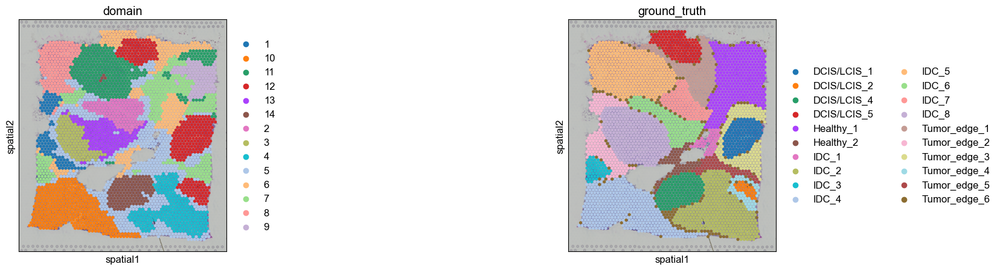

ARI: 0.381, AMI: 0.587, NMI: 0.593, FMI: 0.434, Comp: 0.621, Homo: 0.567
ARI: 0.503, AMI: 0.679, NMI: 0.682, FMI: 0.554, Comp: 0.666, Homo: 0.700


(0.503157421163251,
 0.6786037807348959,
 0.6823137814431436,
 0.5544237768475015,
 0.6659329216470286,
 0.699520849278366)

In [7]:
mm_adata = Trainer.predict(trained_model, train_loader, method = "mclust", num_cluster= 14)
mm_adata.obs['ground_truth'] = mm_adata['rna'].obs['ground_truth'] 
sc.pl.spatial(mm_adata, img_key="hires", color=["domain", "ground_truth"], size=1.5, basis='spatial')
cluster_metrics( mm_adata.obs['ground_truth'], mm_adata.obs['domain'])

mask = ~mm_adata.obs['ground_truth'].str.contains("edge")
cluster_metrics(mm_adata.obs['ground_truth'][mask] , mm_adata.obs['domain'][mask] )

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

identifying domains...
Resolution: 0.4420000000, Number of clusters: 14


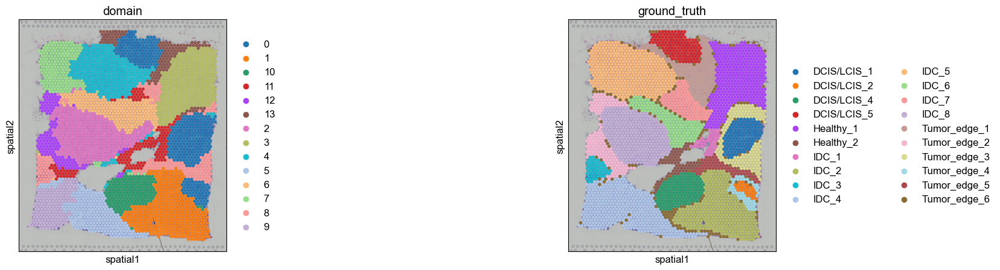

ARI: 0.568, AMI: 0.676, NMI: 0.680, FMI: 0.603, Comp: 0.705, Homo: 0.657
ARI: 0.702, AMI: 0.791, NMI: 0.794, FMI: 0.734, Comp: 0.777, Homo: 0.812


(0.701533798140211,
 0.7914451797635546,
 0.7939921793718875,
 0.7337907305859669,
 0.777191366723219,
 0.81153541919602)

In [8]:
mm_adata = Trainer.predict(trained_model, train_loader, method = "leiden", num_cluster= 14)
mm_adata.obs['ground_truth'] = mm_adata['rna'].obs['ground_truth'] 
sc.pl.spatial(mm_adata, img_key="hires", color=["domain", "ground_truth"], size=1.5, basis='spatial',ncols = 2, #legend_loc='on data', 
                #  save='__BRCA_domain1.pdf'
                 )
cluster_metrics( mm_adata.obs['ground_truth'], mm_adata.obs['domain'])

mask = ~mm_adata.obs['ground_truth'].str.contains("edge")
cluster_metrics(mm_adata.obs['ground_truth'][mask] , mm_adata.obs['domain'][mask] )


In [8]:
mm_adata

MuData object with n_obs × n_vars = 3798 × 36839
  obs:	'domain', 'ground_truth', 'leiden'
  uns:	'spatial', 'log1p', 'domain_colors', 'ground_truth_colors', 'neighbors', 'leiden'
  obsm:	'spatial', 'label_CSL', 'graph_neigh', 'adj', 'metabolic_embedding', 'unified_embedding'
  obsp:	'distances', 'connectivities'
  3 modalities
    rna:	3798 x 474
      obs:	'old_annot_type', 'old_fine_annot_type', '1', '2', '3', '4', '5', 'scaled_x', 'scaled_y', 'fine_annot', 'annot', 'fine_annot_type', 'ground_truth', 'annot_type', 'in_tissue', 'array_row', 'array_col'
      var:	'gene_ids', 'feature_types', 'genome', 'mean', 'std'
      uns:	'spatial', 'log1p'
      obsm:	'spatial'
    flux:	3798 x 168
      var:	'Supermodule_id', 'Super.Module.class', 'X', 'Module_id', 'Compound_IN_name', 'Compound_IN_ID', 'Compound_OUT_name', 'Compound_OUT_ID', 'rxnName'
      uns:	'spatial'
      obsm:	'spatial'
    metabolite:	3798 x 70
      uns:	'spatial'
      obsm:	'spatial'

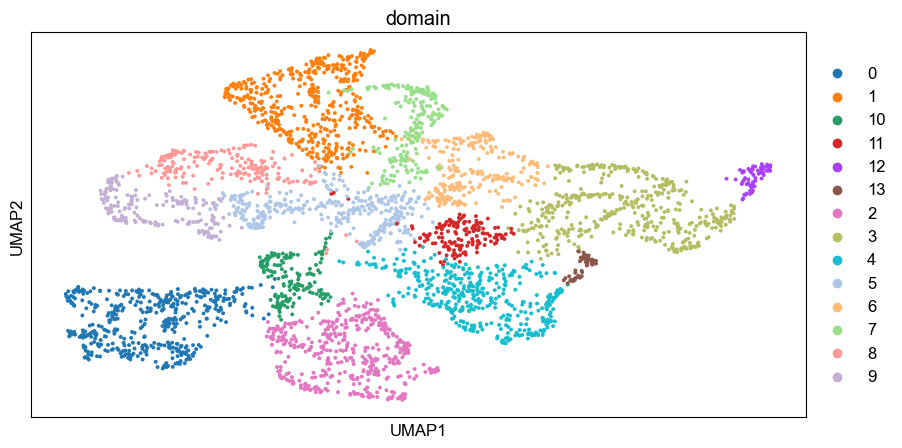

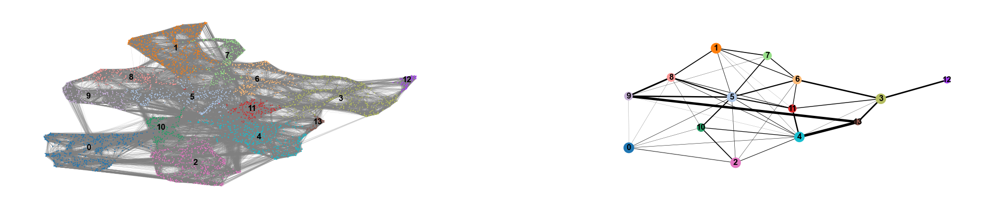

In [30]:
sc.tl.umap(mm_adata)
sc.pl.umap(mm_adata, 
           color=["domain"],
           save='__BRCA_domain1_UMAP.pdf'
           )
sc.tl.paga(mm_adata, groups='domain')
sc.pl.paga_compare(
    mm_adata,
    threshold=0.03,
    title="",
    right_margin=0.2,
    size=10,
    edge_width_scale=0.5,
    legend_fontsize=12,
    fontsize=10,
    frameon=False,
    edges=True,
    # save='__BRCA_domain1_paga.pdf'
    # save=True,
)

In [ ]:
# mm_adata.var_names_make_unique()
uni_modal_adata = mm_adata.mod['rna']
uni_modal_adata.obs['domain'] = mm_adata.obs['domain']
# rna.var.index = rna.var['rxnName']
sc.tl.rank_genes_groups(uni_modal_adata , groupby="domain", use_raw= False, method='wilcoxon')
sc.pl.rank_genes_groups_dotplot(uni_modal_adata, 
                                n_genes=5,  
                                groupby="domain", 
                                values_to_plot='logfoldchanges', 
                                vmin = -3,
                                min_logfoldchange = 0.25,
                                vmax = 3,
                                save="__BRCA_domain1_diff_plot_v1",
                                cmap='bwr')
df = sc.get.rank_genes_groups_df(
    uni_modal_adata, group=None,# gene_symbols='symbol', 
    pval_cutoff=0.005#, log2fc_min=-10, log2fc_max=10
)
df

In [ ]:
sc.pl.spatial(mm_adata['rna'], 
              img_key="hires", 
               color=['ENO1', 'PSMB3', 'MIEN1', 'SEC61G', 'GATA3'],
            #   color = ["PERP", "SMIM14", "CAPN2", "SERPINB3", "EREG","KRT5", "KRT6A"],
              size=1.5, 
              # cmap='Accent',
            #   save='_ER+_CID4290_markers_diff_sig.pdf',
              basis='spatial')

In [ ]:
# mm_adata.write("Results/mm_adata_domain.h5mu")

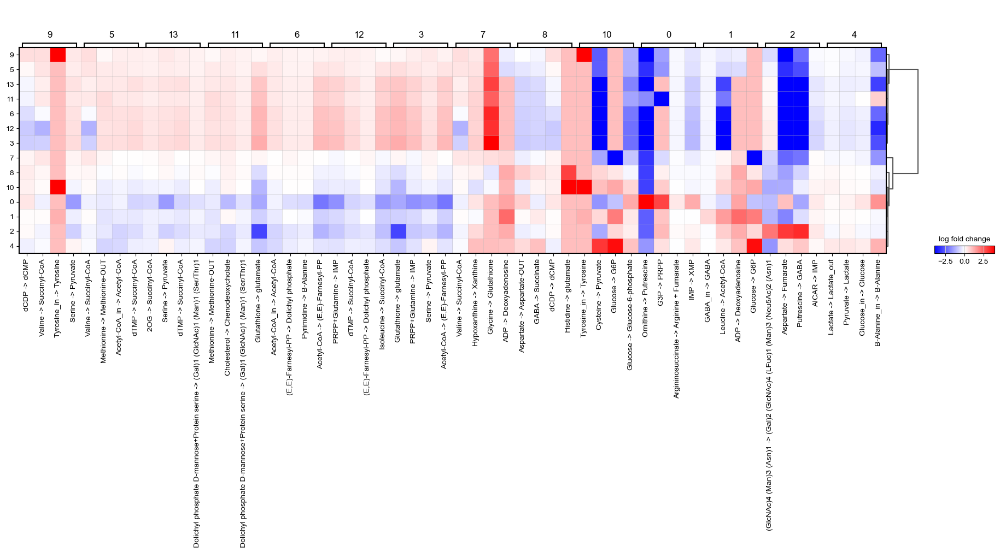

In [10]:
flux_adata = mm_adata.mod['flux']
flux_adata.obs['domain'] = mm_adata.obs['domain']
sc.tl.rank_genes_groups(flux_adata , groupby="domain", use_raw= False, method='wilcoxon')
sc.pl.rank_genes_groups_matrixplot(flux_adata, 
                                n_genes=4,  
                                vmin=-4,
                                vmax=4,
                                min_logfoldchange=0.25,
                                groupby="domain", 
                                values_to_plot='logfoldchanges', 
                                # save="ER+_CID4290_diff_modules.pdf",
                                cmap='bwr')

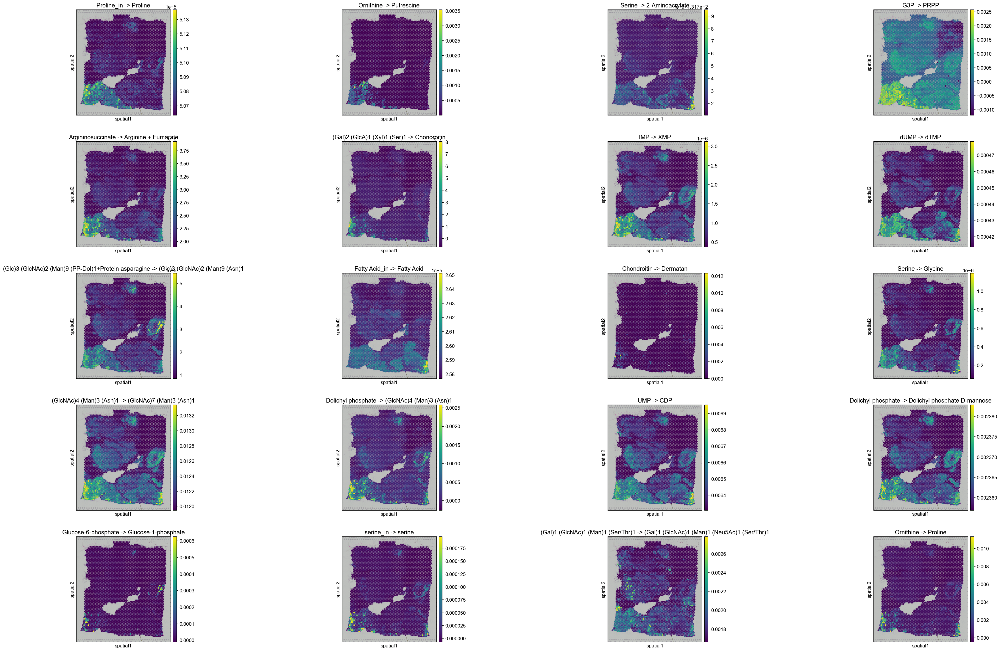

In [ ]:
sc.tl.rank_genes_groups(flux_adata,  groupby="domain" ,method='wilcoxon')
domains = flux_adata.obs['domain'].unique()

df = sc.get.rank_genes_groups_df(
    flux_adata, 
    group=domains,
    pval_cutoff=0.005#, log2fc_min=-10, log2fc_max=10
)
sig_fl = df[df['group'] == '0'].head(20)
# sig_fl = df.head(5)
sig_fl
sc.pl.spatial(flux_adata, 
              img_key="hires", 
              color=list(sig_fl['names']), 
              size=1.5, 
              save='__BRCA_domain1_sig_marker_modules.pdf',
              basis='spatial')


In [29]:
from pandas import get_dummies
from sklearn.neighbors import kneighbors_graph
g = kneighbors_graph(mm_adata.obsm['spatial'], K, mode='connectivity', metric='euclidean')
one_hot = get_dummies(mm_adata.obs['domain'])
moranI = sc.metrics.morans_i(g, one_hot.values.T).mean()
moranI

0.8994310858654556

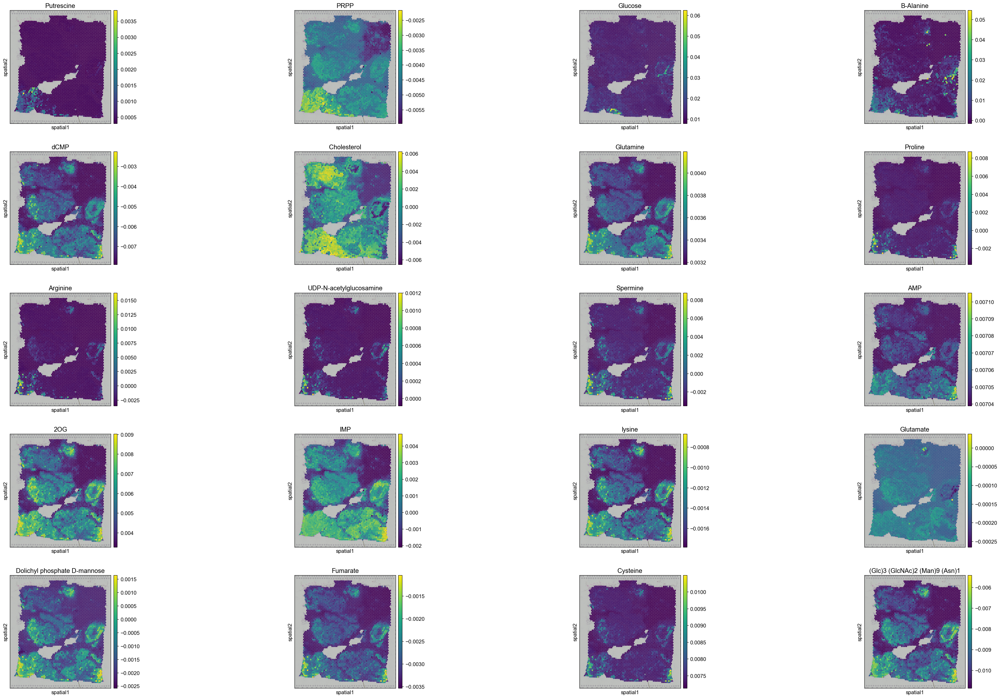

In [ ]:
metabolite_adata = mm_adata['metabolite']
metabolite_adata.obsm['spatial'] = mm_adata.obsm['spatial']
metabolite_adata.obs = mm_adata.obs
metabolite_adata.uns = mm_adata.uns

sc.tl.rank_genes_groups(metabolite_adata,  groupby="domain" ,method='wilcoxon')
domains = metabolite_adata.obs['domain'].unique()

df = sc.get.rank_genes_groups_df(
    metabolite_adata, 
    group=domains,
    pval_cutoff=0.005#, log2fc_min=-10, log2fc_max=10
)
sig_fl = df[df['group'] == '0'].head(20)
sig_fl = df.head(20)
sc.pl.spatial(metabolite_adata, 
              img_key="hires", 
              color=list(sig_fl['names']), 
              size=1.5, 
              save='_BRCA_sig_marker_metabolites.pdf',
              basis='spatial')




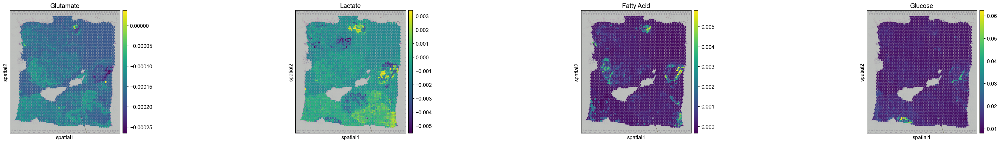

In [17]:
sc.pl.spatial(metabolite_adata, 
              img_key="hires", 
              color=["Glutamate", "Lactate", "Fatty Acid", "Glucose"], 
              size=1.5, 
              save='_BRCA_metabolites-lac_1.pdf',
              basis='spatial')